# Metrical HMM: Belief Geometry Experiments

This notebook explores the belief geometry of a Hidden Markov Model for iambic dimeter.

**Goals:**
1. Visualize belief trajectories on the 3-simplex (tetrahedron)
2. Observe cyclic attractor dynamics
3. Analyze reset dynamics at line boundaries
4. Compare perfect vs. violated meter

In [18]:
import plotly.io as pio
pio.renderers.default = "notebook"

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

# Add parent directory to path for imports
import sys
sys.path.insert(0, '..')

from metrical_hmm import (
    MetricalHMM,
    BinaryEmission,
    VocabEmission,
    PoeticVocabEmission,
    STATE_NAMES,
    UNSTRESSED, STRESSED,
)
from metrical_hmm.visualization import (
    plot_belief_trajectory,
    plot_multiple_trajectories,
    plot_belief_trajectory_2d,
    plot_state_marginals,
    plot_reset_dynamics,
    compare_trajectories,
    create_animation,
    # Interactive plotly versions
    plot_belief_trajectory_interactive,
    plot_multiple_trajectories_interactive,
    plot_reset_dynamics_interactive,
    compare_trajectories_interactive,
)
from metrical_hmm.analysis import (
    belief_entropy,
    normalized_entropy,
    detect_resets,
    cycle_period,
    summary_statistics,
)

%matplotlib inline
plt.style.use('seaborn-v0_8-whitegrid')

## 1. HMM Setup

Create a Metrical HMM with binary emissions (stressed/unstressed).

In [40]:
# Create emission model
emission = BinaryEmission(clarity=0.85)

# Create HMM with default settings
hmm = MetricalHMM(
    emission_model=emission,
    strictness=0.9,
    allow_skips=True,
    line_reset_prob=0.9
)

print(hmm)
print(f"\nTransition matrix:\n{hmm.A.round(3)}")
print(f"\nEmission matrix:\n{hmm.B.round(3)}")
print(f"\nInitial distribution: {hmm.pi.round(3)}")
print(f"\nErgodic: {hmm.is_ergodic()}")
print(f"Stationary distribution: {hmm.stationary_distribution().round(3)}")

MetricalHMM(strictness=0.90, allow_skips=True, line_reset_prob=0.90)

Transition matrix:
[[0.033 0.9   0.033 0.033]
 [0.033 0.033 0.9   0.033]
 [0.033 0.033 0.033 0.9  ]
 [0.9   0.033 0.033 0.033]]

Emission matrix:
[[0.85 0.15]
 [0.15 0.85]
 [0.85 0.15]
 [0.15 0.85]]

Initial distribution: [0.85 0.05 0.05 0.05]

Ergodic: True
Stationary distribution: [0.25 0.25 0.25 0.25]


## 2. Generate Sample Sequences

Generate sequences and verify they look like meter.

In [41]:
# Generate a sequence
np.random.seed(42)
states, observations = hmm.sample(80, seed=42)

# Display as "verse"
obs_names = ['u', 'S']  # unstressed, Stressed
obs_str = [obs_names[o] for o in observations]

print("Generated sequence (u=unstressed, S=stressed):")
print("Expected pattern: u S u S | u S u S | ...")
print()

# Format as lines of 4
for i in range(0, len(obs_str), 4):
    line = ' '.join(obs_str[i:i+4])
    state_line = ' '.join([STATE_NAMES[s] for s in states[i:i+4]])
    print(f"Line {i//4 + 1:2d}: {line}  |  states: {state_line}")

Generated sequence (u=unstressed, S=stressed):
Expected pattern: u S u S | u S u S | ...

Line  1: u S S S  |  states: W1 S1 W2 S2
Line  2: u S u S  |  states: W1 S1 W2 S2
Line  3: u S u S  |  states: W1 S1 W2 S2
Line  4: u u u S  |  states: W1 S1 W2 S2
Line  5: u S u S  |  states: W1 S1 W2 S2
Line  6: u S u S  |  states: W1 S1 W2 S2
Line  7: u u u S  |  states: W1 S1 W2 S2
Line  8: u u u S  |  states: W1 S1 W2 S2
Line  9: u S u S  |  states: W1 S1 W1 S1
Line 10: u S u S  |  states: W2 S1 W2 S2
Line 11: u S u S  |  states: W1 S1 W1 S1
Line 12: u S u S  |  states: W2 S2 W1 S1
Line 13: u S S S  |  states: W2 S2 S1 W2
Line 14: S u S u  |  states: S2 W1 S1 W2
Line 15: S S S u  |  states: S2 W1 S1 W2
Line 16: S u S u  |  states: S2 W1 S1 W2
Line 17: S S S u  |  states: S2 W1 S1 W2
Line 18: S u S u  |  states: S2 W1 S1 W2
Line 19: S u u S  |  states: S2 W1 S1 W2
Line 20: S u S u  |  states: S2 W1 S1 W2


## 3. Compute Belief Trajectory

Run the forward algorithm to get posterior beliefs over time.

In [22]:
# Compute beliefs
beliefs = hmm.forward(observations)

print(f"Belief shape: {beliefs.shape}")
print(f"\nFirst 10 belief states:")
print("t  | P(W1)  P(S1)  P(W2)  P(S2) | obs | true state")
print("-" * 55)
for t in range(10):
    b = beliefs[t]
    print(f"{t:2d} | {b[0]:.3f}  {b[1]:.3f}  {b[2]:.3f}  {b[3]:.3f} |  {obs_names[observations[t]]}  | {STATE_NAMES[states[t]]}")

Belief shape: (80, 4)

First 10 belief states:
t  | P(W1)  P(S1)  P(W2)  P(S2) | obs | true state
-------------------------------------------------------
 0 | 0.926  0.010  0.054  0.010 |  u  | W1
 1 | 0.008  0.898  0.008  0.087 |  S  | S1
 2 | 0.075  0.170  0.585  0.170 |  S  | W2
 3 | 0.043  0.143  0.046  0.768 |  S  | S2
 4 | 0.768  0.017  0.198  0.018 |  u  | W1
 5 | 0.009  0.759  0.009  0.222 |  S  | S1
 6 | 0.232  0.009  0.751  0.009 |  u  | W2
 7 | 0.008  0.252  0.008  0.733 |  S  | S2
 8 | 0.691  0.010  0.288  0.010 |  u  | W1
 9 | 0.008  0.680  0.008  0.304 |  S  | S1


## 4. Visualize Belief Trajectory on Simplex

In [23]:
# Plot 3D trajectory (interactive - drag to rotate!)
fig = plot_belief_trajectory_interactive(beliefs, title="Belief Trajectory (Interactive)")
fig.show()

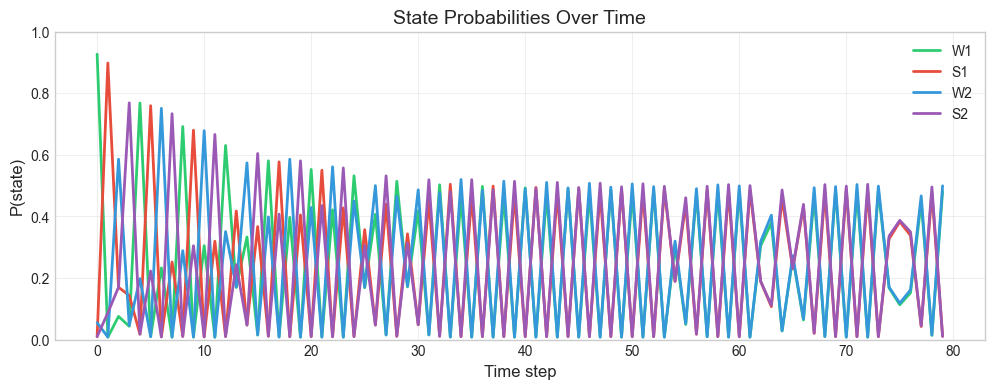

In [24]:
# Plot state marginals over time
fig, ax = plot_state_marginals(beliefs, title="State Probabilities Over Time")
plt.show()

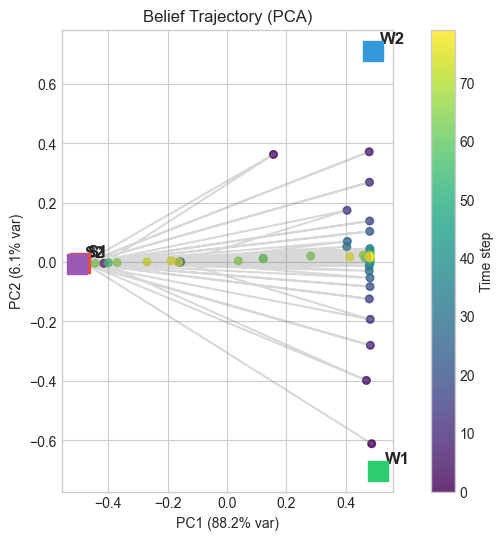

In [25]:
# 2D PCA projection
fig, ax = plot_belief_trajectory_2d(beliefs, title="Belief Trajectory (PCA)")
plt.show()

## 5. Multiple Trajectories (Attractor Structure)

Overlay multiple trajectories to see the "tube" around the cycle.

In [26]:
# Generate multiple trajectories
n_trajectories = 10
belief_list = []

for i in range(n_trajectories):
    _, obs = hmm.sample(80, seed=i)
    belief_list.append(hmm.forward(obs))

# Interactive version - drag to rotate!
fig = plot_multiple_trajectories_interactive(
    belief_list, 
    title=f"Attractor Structure ({n_trajectories} trajectories)"
)
fig.show()

## 6. Reset Dynamics at Line Boundaries

In [27]:
# Visualize reset dynamics (interactive)
fig = plot_reset_dynamics_interactive(
    beliefs, observations, 
    line_length=4,
    title="Line Boundary Reset Dynamics (Interactive)"
)
fig.show()

In [29]:
# Detect and analyze resets
resets = detect_resets(beliefs, w1_threshold=0.5)
print(f"Detected {len(resets)} resets at indices: {resets}")
print(f"Expected resets every ~4 steps (line boundaries)")

if len(resets) > 1:
    intervals = np.diff(resets)
    print(f"\nReset intervals: {intervals}")
    print(f"Mean interval: {intervals.mean():.2f} steps")

Detected 8 resets at indices: [ 4  8 12 16 20 24 28 32]
Expected resets every ~4 steps (line boundaries)

Reset intervals: [4 4 4 4 4 4 4]
Mean interval: 4.00 steps


## 7. Entropy Analysis

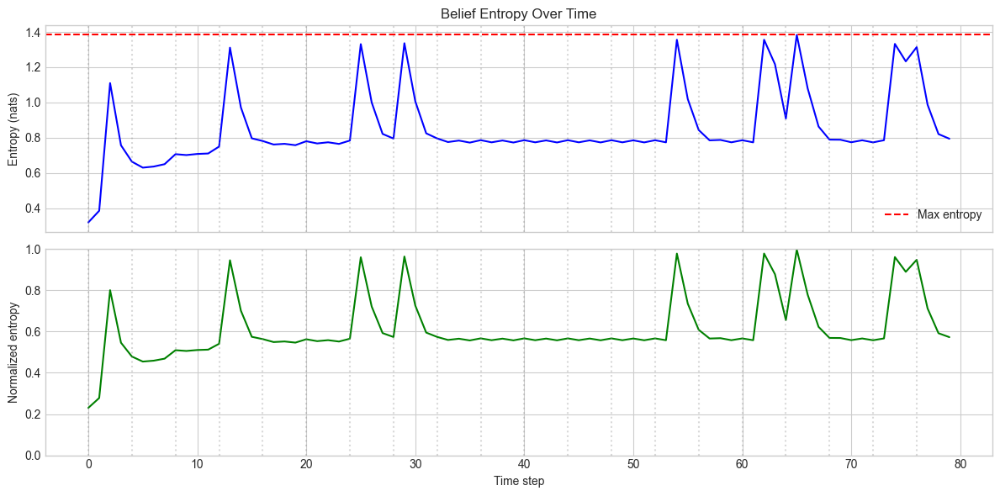

Mean entropy: 0.851 nats
Min entropy: 0.319 (most confident)
Max entropy: 1.383 (most uncertain)


In [30]:
# Plot entropy over time
entropy = belief_entropy(beliefs)
norm_entropy = normalized_entropy(beliefs)

fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

axes[0].plot(entropy, 'b-', linewidth=1.5)
axes[0].set_ylabel('Entropy (nats)')
axes[0].set_title('Belief Entropy Over Time')
axes[0].axhline(y=np.log(4), color='r', linestyle='--', label='Max entropy')
axes[0].legend()

# Mark line boundaries
for i in range(0, len(beliefs), 4):
    axes[0].axvline(x=i, color='gray', alpha=0.3, linestyle=':')

axes[1].plot(norm_entropy, 'g-', linewidth=1.5)
axes[1].set_xlabel('Time step')
axes[1].set_ylabel('Normalized entropy')
axes[1].set_ylim([0, 1])

for i in range(0, len(beliefs), 4):
    axes[1].axvline(x=i, color='gray', alpha=0.3, linestyle=':')

plt.tight_layout()
plt.show()

print(f"Mean entropy: {entropy.mean():.3f} nats")
print(f"Min entropy: {entropy.min():.3f} (most confident)")
print(f"Max entropy: {entropy.max():.3f} (most uncertain)")

## 8. Compare Perfect vs. Violated Meter

In [31]:
# Create perfect iambic sequence: u S u S u S u S ...
perfect_obs = np.array([UNSTRESSED, STRESSED] * 40)  # 80 observations

# Create violated sequence: introduce stress reversal
violated_obs = perfect_obs.copy()
# Swap stress at positions 8-11 (start of line 3)
violated_obs[8:12] = [STRESSED, UNSTRESSED, STRESSED, UNSTRESSED]

# Compute beliefs
beliefs_perfect = hmm.forward(perfect_obs)
beliefs_violated = hmm.forward(violated_obs)

print("Perfect sequence: u S u S u S u S ...")
print("Violated sequence: u S u S u S u S | S u S u | u S u S ...")
print("                                     ^^^^^^^^ (reversed)")

Perfect sequence: u S u S u S u S ...
Violated sequence: u S u S u S u S | S u S u | u S u S ...
                                     ^^^^^^^^ (reversed)


In [32]:
# Side-by-side comparison (interactive)
fig = compare_trajectories_interactive(
    [beliefs_perfect, beliefs_violated],
    ['Perfect Meter', 'Violated Meter (line 3)']
)
fig.show()

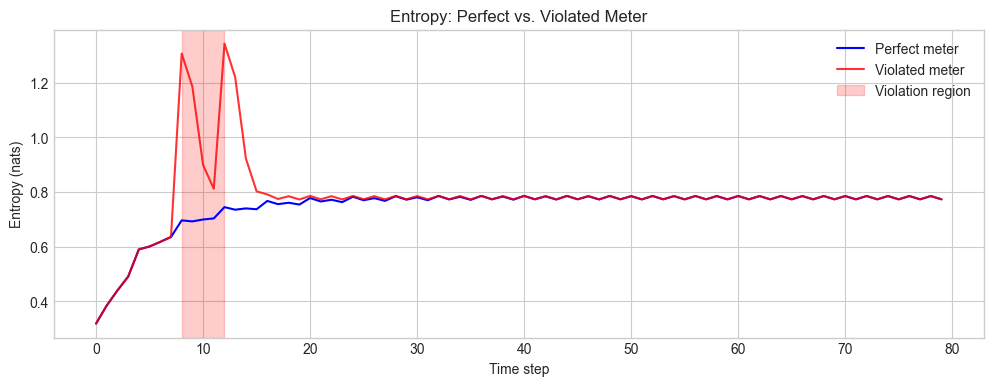

Entropy spike at violation: 1.307 vs normal: 0.704


In [34]:
# Compare entropy profiles
entropy_perfect = belief_entropy(beliefs_perfect)
entropy_violated = belief_entropy(beliefs_violated)

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(entropy_perfect, 'b-', label='Perfect meter', linewidth=1.5)
ax.plot(entropy_violated, 'r-', label='Violated meter', linewidth=1.5, alpha=0.8)
ax.axvspan(8, 12, alpha=0.2, color='red', label='Violation region')
ax.set_xlabel('Time step')
ax.set_ylabel('Entropy (nats)')
ax.set_title('Entropy: Perfect vs. Violated Meter')
ax.legend()
plt.show()

print(f"Entropy spike at violation: {entropy_violated[8:12].max():.3f} vs normal: {entropy_perfect[8:12].max():.3f}")

## 9. Effect of Strictness Parameter

In [37]:
# Compare different strictness levels
strictness_levels = [0.6, 0.85, 0.99]
belief_lists = []
labels = []

for s in strictness_levels:
    hmm_s = MetricalHMM(BinaryEmission(clarity=0.85), strictness=s, allow_skips=True)
    _, obs = hmm_s.sample(80, seed=42)
    beliefs_s = hmm_s.forward(obs)
    belief_lists.append(beliefs_s)
    labels.append(f'Strictness={s}')

# Interactive comparison
fig = compare_trajectories_interactive(belief_lists, labels)
fig.show()

## 10. Skip vs. No-Skip Transitions

In [42]:
# Compare with and without skip transitions
hmm_skip = MetricalHMM(BinaryEmission(), strictness=0.9, allow_skips=True)
hmm_noskip = MetricalHMM(BinaryEmission(), strictness=0.9, allow_skips=False)

_, obs_skip = hmm_skip.sample(80, seed=42)
_, obs_noskip = hmm_noskip.sample(80, seed=42)

beliefs_skip = hmm_skip.forward(obs_skip)
beliefs_noskip = hmm_noskip.forward(obs_noskip)

# Interactive comparison
fig = compare_trajectories_interactive(
    [beliefs_skip, beliefs_noskip],
    ['With Skips', 'No Skips (pure cycle)']
)
fig.show()

print("Transition matrix (with skips):")
print(hmm_skip.A.round(3))
print("\nTransition matrix (no skips):")
print(hmm_noskip.A.round(3))

Transition matrix (with skips):
[[0.033 0.9   0.033 0.033]
 [0.033 0.033 0.9   0.033]
 [0.033 0.033 0.033 0.9  ]
 [0.85  0.05  0.05  0.05 ]]

Transition matrix (no skips):
[[0.1  0.9  0.   0.  ]
 [0.   0.1  0.9  0.  ]
 [0.   0.   0.1  0.9 ]
 [0.85 0.   0.   0.15]]


## 11. Viterbi Decoding Comparison

In [20]:
# Compare forward beliefs with Viterbi decoding
states_true, observations = hmm.sample(40, seed=123)
beliefs = hmm.forward(observations)
states_viterbi, log_prob = hmm.viterbi(observations)

# Most likely state from beliefs
states_argmax = np.argmax(beliefs, axis=1)

print("Comparison of state estimation methods:")
print("t  | True  | Viterbi | ArgMax(belief)")
print("-" * 42)
for t in range(20):
    true = STATE_NAMES[states_true[t]]
    vit = STATE_NAMES[states_viterbi[t]]
    argmax = STATE_NAMES[states_argmax[t]]
    match = "ok" if states_viterbi[t] == states_true[t] else "X"
    print(f"{t:2d} | {true:4s} | {vit:7s} | {argmax:14s} | {match}")

# Accuracy
viterbi_acc = (states_viterbi == states_true).mean()
argmax_acc = (states_argmax == states_true).mean()
print(f"\nViterbi accuracy: {viterbi_acc:.1%}")
print(f"ArgMax accuracy: {argmax_acc:.1%}")

Comparison of state estimation methods:
t  | True  | Viterbi | ArgMax(belief)
------------------------------------------
 0 | W1   | W1      | W1             | ok
 1 | S1   | S1      | S1             | ok
 2 | W2   | W2      | W2             | ok
 3 | S2   | S2      | S2             | ok
 4 | W1   | W1      | W1             | ok
 5 | S1   | S1      | S1             | ok
 6 | W2   | W2      | W2             | ok
 7 | S2   | S2      | S2             | ok
 8 | W2   | W1      | W1             | X
 9 | S2   | S1      | S1             | X
10 | W1   | W2      | W2             | X
11 | S1   | S2      | S2             | X
12 | W2   | W1      | W1             | X
13 | S2   | S1      | S1             | X
14 | W2   | W2      | W2             | ok
15 | S2   | S2      | S2             | ok
16 | W1   | W1      | W1             | ok
17 | S1   | S1      | S1             | ok
18 | W2   | W2      | W2             | ok
19 | S2   | S2      | S2             | ok

Viterbi accuracy: 57.5%
ArgMax accuracy: 65.

## 12. Summary Statistics

In [21]:
# Compute summary statistics
stats = summary_statistics(beliefs, states_true)

print("Summary Statistics:")
print("=" * 40)
for key, value in stats.items():
    if isinstance(value, float):
        print(f"{key:25s}: {value:.4f}")
    else:
        print(f"{key:25s}: {value}")

Summary Statistics:
length                   : 40
mean_entropy             : 0.8447
std_entropy              : 0.2538
trajectory_length        : 33.5853
mean_velocity            : 0.8612
estimated_period         : 2
num_resets               : 3
mean_reset_interval      : 6.0000
mean_p_W1                : 0.2363
mean_p_S1                : 0.2624
mean_p_W2                : 0.2396
mean_p_S2                : 0.2616
W1_mean_dwell            : 1.0000
S1_mean_dwell            : 1.0000
W2_mean_dwell            : 1.0000
S2_mean_dwell            : 1.0000


## 13. Extended Vocabulary Demo

In [22]:
# Use poetic vocabulary
poetic_emission = PoeticVocabEmission(clarity=0.85)
hmm_poetic = MetricalHMM(poetic_emission, strictness=0.9, allow_skips=True)

states, obs = hmm_poetic.sample(32, seed=42)

print("Generated 'verse' with poetic vocabulary:")
print("=" * 40)
print(poetic_emission.format_as_verse(obs, line_length=4))
print()
print("State sequence:")
for i in range(0, len(states), 4):
    state_line = ' '.join([STATE_NAMES[s] for s in states[i:i+4]])
    print(f"  {state_line}")

Generated 'verse' with poetic vocabulary:
in SOUL LIFE SOUL
in TIME with LOVE
a NIGHT and LIFE
the to for TIME
and LOVE in NIGHT
with HEART with HEART
the a for SOUL
of for in SOUL

State sequence:
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2
  W1 S1 W2 S2


## 14. Animation (Optional)

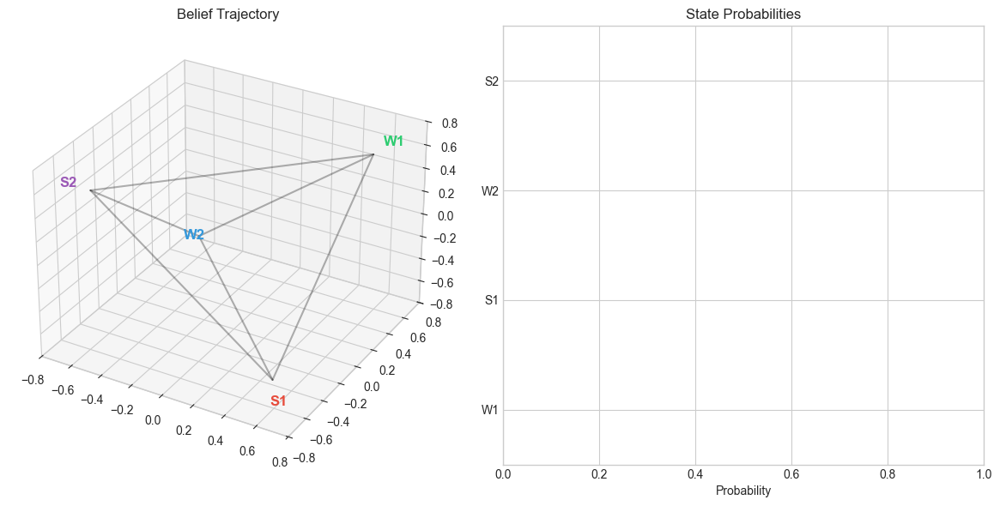

In [23]:
# Create animation (uncomment to run - requires ffmpeg for saving)
from matplotlib import animation

states, obs = hmm.sample(60, seed=42)
beliefs = hmm.forward(obs)
anim = create_animation(beliefs, obs, hmm.emission_model, interval=150)
HTML(anim.to_jshtml())

---

## Next Steps

1. **LLM Integration**: Feed these sequences to a pretrained LLM and extract activations
2. **Geometry Comparison**: Compare LLM activation geometry to belief simplex geometry
3. **Tetrameter Extension**: Extend to 8-state iambic tetrameter for richer structure